In [1]:
# ===========================
# Cell 1 — Imports + sys.path (notebook inside src/)
# ===========================
import os, sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display
from PIL import Image, ImageDraw

SRC_DIR = os.path.abspath(os.getcwd())                  # src/
BENCH_DIR = os.path.join(SRC_DIR, "cartpole_gp_bench")   # src/cartpole_gp_bench

if BENCH_DIR not in sys.path:
    sys.path.insert(0, BENCH_DIR)

print("SRC_DIR  :", SRC_DIR)
print("BENCH_DIR:", BENCH_DIR)

from cartpole_env import make_env, obs_to_state, wrap_pi, state_to_features, U_MIN, U_MAX
print("✅ cartpole_env OK")


SRC_DIR  : C:\Users\wts28\Documents\Labwork\MonsterTruck\cartpole_gp_compare\src\cartpole_gp_bench
BENCH_DIR: C:\Users\wts28\Documents\Labwork\MonsterTruck\cartpole_gp_compare\src\cartpole_gp_bench\cartpole_gp_bench
✅ cartpole_env OK


In [2]:
# ===========================
# Cell 2 — Pure-PIL renderer (x, theta) -> RGB frame
#   - No env.render(), no pygame
# ===========================
def render_cartpole_frame_from_state(
    x, theta,
    x_threshold=2.4,
    W=720, H=450,
    cart_width=70,
    cart_height=35,
    pole_length_px=160,
    pole_width=10,
):
    img = Image.new("RGB", (W, H), (245, 245, 245))
    dr = ImageDraw.Draw(img)

    y_track = int(0.72 * H)
    dr.line([(0, y_track), (W, y_track)], fill=(210, 210, 210), width=4)

    margin = 40
    x_clamped = float(np.clip(x, -x_threshold, x_threshold))
    x_norm = (x_clamped + x_threshold) / (2 * x_threshold)
    cx = int(margin + x_norm * (W - 2 * margin))
    cy = y_track - cart_height // 2

    x0 = cx - cart_width // 2
    y0 = cy - cart_height // 2
    x1 = cx + cart_width // 2
    y1 = cy + cart_height // 2
    dr.rounded_rectangle([x0, y0, x1, y1], radius=8, fill=(60, 90, 160), outline=(30, 30, 30), width=2)

    ax = cx
    ay = y0 + 6

    dx = pole_length_px * float(np.sin(theta))
    dy = -pole_length_px * float(np.cos(theta))
    px = ax + dx
    py = ay + dy

    dr.line([(ax, ay), (px, py)], fill=(180, 50, 50), width=pole_width)

    r = 8
    dr.ellipse([ax - r, ay - r, ax + r, ay + r], fill=(30, 30, 30))

    return np.asarray(img, dtype=np.uint8)


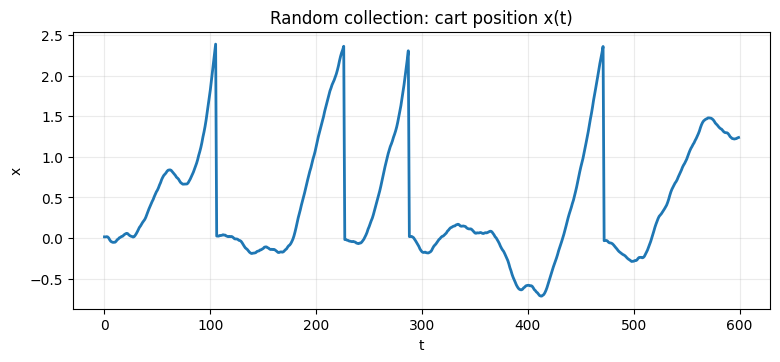

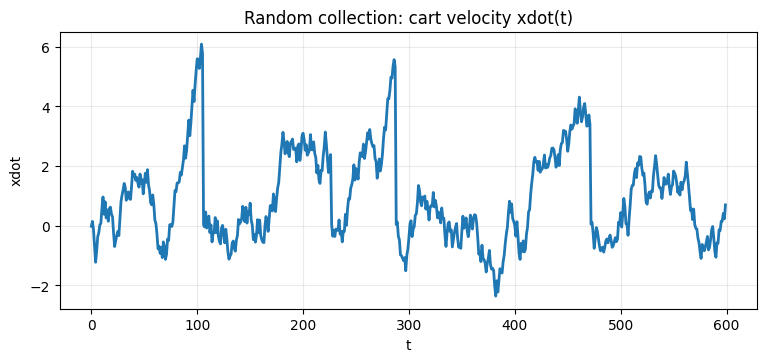

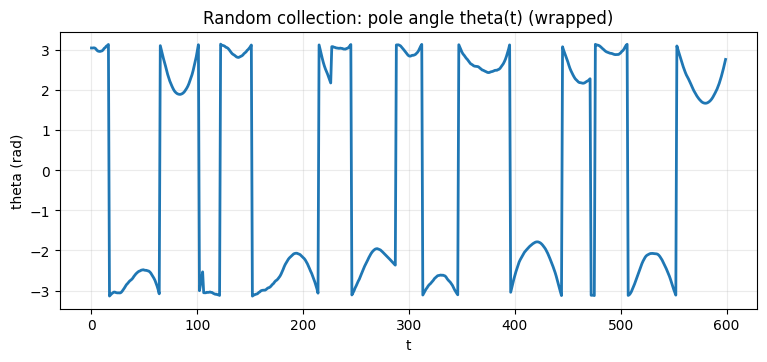

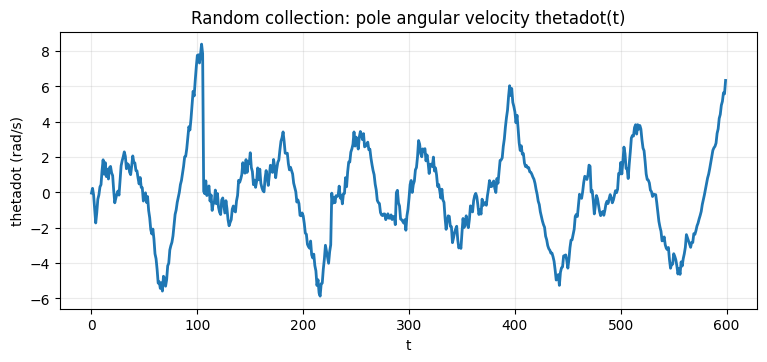

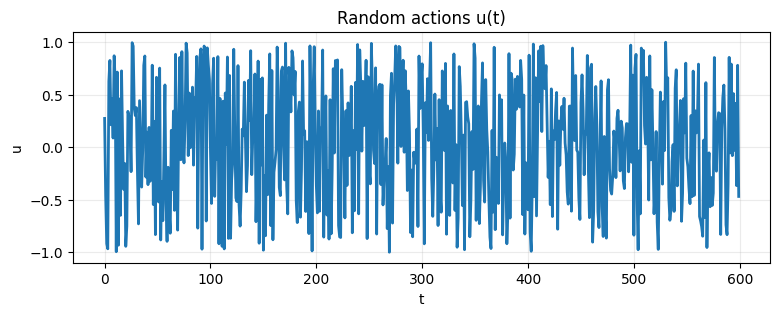

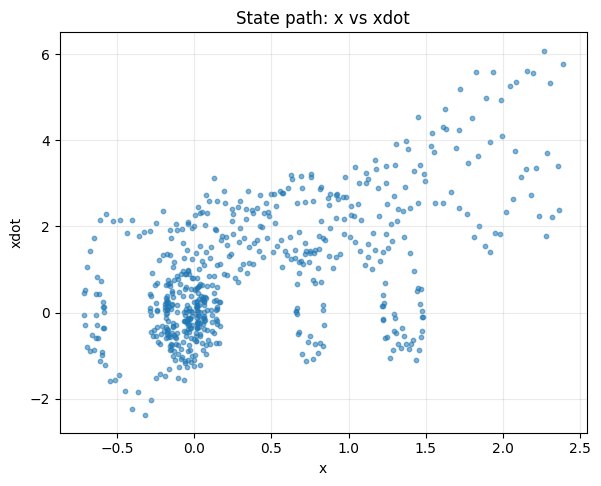

Collected X0 shape: (596, 6) (6D features)
Collected Y0 shape: (596, 4) (dx, dxdot, dtheta, dthetadot)
Kept=596  Dropped(respawn)=4  Resets=0
Y0 mean: [ 0.01788815  0.02887039 -0.00106429  0.01786792]
Y0 std : [0.02985943 0.32882171 0.04925438 0.44947059]


In [3]:
# ===========================
# Cell 3 — Random collection (600) + inline animation + trajectory plots
#   Output:
#     X0: (N,6)
#     Y0: (N,4) = [dx, dxdot, dtheta, dthetadot]
#   Behavior:
#     - drops respawn transitions if info["respawned"]=True
# ===========================
def collect_random_transitions_rendered_cartpole(
    n_steps=600,
    seed=0,
    max_episode_steps=500,
    start_down=True,
    frame_stride=2,
    resize=(720, 450),
    fps=20,
    edge_respawn=True,
    respawn_penalty=-2.0,
    drop_respawn_transitions=True,
    verbose=False,
):
    rng = np.random.default_rng(seed)

    env = make_env(
        render_mode=None,   # we render ourselves
        seed=seed,
        max_episode_steps=max_episode_steps,
        start_down=start_down,
        edge_respawn=edge_respawn,
        respawn_penalty=respawn_penalty,
    )

    obs, info = env.reset(seed=seed)
    x, xdot, th, thdot = obs_to_state(obs)

    X_list, Y_list = [], []
    traj_x, traj_xdot, traj_th, traj_thdot, traj_u = [], [], [], [], []
    frames = []
    dropped = 0
    resets = 0

    W, H = int(resize[0]), int(resize[1])

    for t in range(int(n_steps)):
        u = float(rng.uniform(U_MIN, U_MAX))

        obs2, reward, terminated, truncated, info = env.step(np.array([u], dtype=np.float32))
        x2, xdot2, th2, thdot2 = obs_to_state(obs2)

        respawned = bool(isinstance(info, dict) and info.get("respawned", False))
        if respawned and drop_respawn_transitions:
            dropped += 1
        else:
            X_list.append(state_to_features(x, xdot, th, thdot, u))
            Y_list.append([x2 - x, xdot2 - xdot, wrap_pi(th2 - th), thdot2 - thdot])

        traj_x.append(x)
        traj_xdot.append(xdot)
        traj_th.append(th)
        traj_thdot.append(thdot)
        traj_u.append(u)

        if (t % int(frame_stride)) == 0:
            frames.append(render_cartpole_frame_from_state(x2, th2, x_threshold=2.4, W=W, H=H))

        x, xdot, th, thdot = x2, xdot2, th2, thdot2

        if terminated or truncated:
            resets += 1
            obs, info = env.reset(seed=int(seed + 123 + t))
            x, xdot, th, thdot = obs_to_state(obs)
            if verbose:
                print(f"[t={t:04d}] reset (terminated={terminated}, truncated={truncated})")

    env.close()

    X0 = np.asarray(X_list, dtype=np.float64)
    Y0 = np.asarray(Y_list, dtype=np.float64)

    traj = dict(
        x=np.asarray(traj_x, dtype=np.float64),
        xdot=np.asarray(traj_xdot, dtype=np.float64),
        theta=np.asarray(traj_th, dtype=np.float64),
        thetadot=np.asarray(traj_thdot, dtype=np.float64),
        u=np.asarray(traj_u, dtype=np.float64),
        dropped_respawn=int(dropped),
        resets=int(resets),
        steps=int(n_steps),
        kept=int(X0.shape[0]),
    )

    # --- inline animation ---
    if len(frames) > 0:
        fig = plt.figure(figsize=(W / 100, H / 100), dpi=100)
        plt.axis("off")
        im = plt.imshow(frames[0])

        def animate_fn(i):
            im.set_data(frames[i])
            return [im]

        ani = animation.FuncAnimation(
            fig, animate_fn, frames=len(frames), interval=1000 / float(fps), blit=True
        )
        plt.close(fig)
        display(HTML(ani.to_jshtml()))
    else:
        print("⚠️ No frames collected (check frame_stride / resize).")

    # --- trajectory plots ---
    tgrid = np.arange(len(traj["x"]))

    plt.figure(figsize=(9, 3.6))
    plt.plot(tgrid, traj["x"], linewidth=2)
    plt.xlabel("t"); plt.ylabel("x"); plt.title("Random collection: cart position x(t)")
    plt.grid(True, alpha=0.25); plt.show()

    plt.figure(figsize=(9, 3.6))
    plt.plot(tgrid, traj["xdot"], linewidth=2)
    plt.xlabel("t"); plt.ylabel("xdot"); plt.title("Random collection: cart velocity xdot(t)")
    plt.grid(True, alpha=0.25); plt.show()

    plt.figure(figsize=(9, 3.6))
    plt.plot(tgrid, traj["theta"], linewidth=2)
    plt.xlabel("t"); plt.ylabel("theta (rad)"); plt.title("Random collection: pole angle theta(t) (wrapped)")
    plt.grid(True, alpha=0.25); plt.show()

    plt.figure(figsize=(9, 3.6))
    plt.plot(tgrid, traj["thetadot"], linewidth=2)
    plt.xlabel("t"); plt.ylabel("thetadot (rad/s)"); plt.title("Random collection: pole angular velocity thetadot(t)")
    plt.grid(True, alpha=0.25); plt.show()

    plt.figure(figsize=(9, 3.0))
    plt.plot(tgrid, traj["u"], linewidth=2)
    plt.xlabel("t"); plt.ylabel("u"); plt.title("Random actions u(t)")
    plt.grid(True, alpha=0.25); plt.show()

    plt.figure(figsize=(6.8, 5.2))
    plt.scatter(traj["x"], traj["xdot"], s=10, alpha=0.55)
    plt.xlabel("x"); plt.ylabel("xdot"); plt.title("State path: x vs xdot")
    plt.grid(True, alpha=0.25); plt.show()

    print("Collected X0 shape:", X0.shape, "(6D features)")
    print("Collected Y0 shape:", Y0.shape, "(dx, dxdot, dtheta, dthetadot)")
    print(f"Kept={traj['kept']}  Dropped(respawn)={traj['dropped_respawn']}  Resets={traj['resets']}")

    return X0, Y0, frames, traj


SEED = 0
X0, Y0, frames0, traj0 = collect_random_transitions_rendered_cartpole(
    n_steps=600,
    seed=SEED,
    max_episode_steps=500,
    start_down=True,
    frame_stride=2,
    resize=(720, 450),
    fps=20,
    edge_respawn=True,
    respawn_penalty=-2.0,
    drop_respawn_transitions=True,
    verbose=False,
)

# Optional: simple sanity stats (no extra deps)
print("Y0 mean:", Y0.mean(axis=0))
print("Y0 std :", Y0.std(axis=0))


In [4]:
# ===========================
# Cell 4 — Train initial models + predict-speed benchmark + SAVE SNAPSHOTS (no model.save needed)
# ===========================
import os, json, time
import numpy as np
from datetime import datetime

import tensorflow as tf
import gpflow

from models.exact_gp import ExactGPDynamics
from models.svgp import SVGPDynamics
from models.ssgp import SSGPDynamics
from models.palsgp import PALSGPDynamics

assert "X0" in globals() and "Y0" in globals(), "Run the random-collection cell first to create X0, Y0."
assert X0.ndim == 2 and X0.shape[1] == 6, f"X0 must be (N,6), got {X0.shape}"
assert Y0.ndim == 2 and Y0.shape[1] == 4, f"Y0 must be (N,4), got {Y0.shape}"

SEED_MODELS = 0
HORIZON = 40
u_mean0 = np.zeros((HORIZON,), dtype=np.float64)

if "traj0" in globals() and isinstance(traj0, dict) and len(traj0.get("x", [])) > 0:
    state0 = np.array(
        [traj0["x"][-1], traj0["xdot"][-1], traj0["theta"][-1], traj0["thetadot"][-1]],
        dtype=np.float64,
    )
else:
    state0 = np.zeros((4,), dtype=np.float64)

models_list = [
    ExactGPDynamics(name="ExactGP"),
    SVGPDynamics(name="SVGP", seed=SEED_MODELS),
    SSGPDynamics(name="SSGP"),
    PALSGPDynamics(name="PALSGP", seed=SEED_MODELS),
]


def bench_predict_ms(model, Xq, iters=200, warmup=10):
    Xq = np.asarray(Xq, dtype=np.float64)
    for _ in range(int(warmup)):
        model.predict(Xq)
    t0 = time.perf_counter()
    for _ in range(int(iters)):
        model.predict(Xq)
    t1 = time.perf_counter()
    return 1000.0 * (t1 - t0) / float(iters)


# ----------------------------
# Snapshot saving (no model.save required)
# ----------------------------
RUN_ID = datetime.now().strftime("%Y%m%d_%H%M%S")
SAVE_ROOT = os.path.join("saved_models", f"run_{RUN_ID}")
os.makedirs(SAVE_ROOT, exist_ok=True)

def _json_dump(path, obj):
    with open(path, "w", encoding="utf-8") as f:
        json.dump(obj, f, indent=2)

def _to_numpy(x):
    if isinstance(x, (np.ndarray, np.number)):
        return np.asarray(x)
    if tf.is_tensor(x):
        return x.numpy()
    try:
        return np.asarray(x)
    except Exception:
        return x

def _save_npz(path, **arrays):
    clean = {}
    for k, v in arrays.items():
        try:
            clean[k] = _to_numpy(v)
        except Exception:
            pass
    np.savez(path, **clean)

def _save_gpflow_param_dict(path, gpflow_module):
    # gpflow.utilities.parameter_dict returns nested dict of numpy arrays
    pd = gpflow.utilities.parameter_dict(gpflow_module)
    _json_dump(path, pd)

def save_snapshot(model, out_dir, meta):
    os.makedirs(out_dir, exist_ok=True)
    _json_dump(os.path.join(out_dir, "meta.json"), meta)
    _json_dump(os.path.join(out_dir, "stats.json"), model.stats())

    # Common: dump any obvious numpy fields if present
    extras = {}
    for attr in ["Z_global", "Z_GLOBAL", "Z", "Z_old", "Z_GLOBAL", "ANCHOR_IDX", "IDX_SUB"]:
        if hasattr(model, attr):
            try:
                extras[attr] = _to_numpy(getattr(model, attr))
            except Exception:
                pass
    if len(extras) > 0:
        _save_npz(os.path.join(out_dir, "extras.npz"), **extras)

    # Now handle underlying GPflow models
    # Case A: model.models (list of GPflow models) e.g., ExactGP/SSGP
    if hasattr(model, "models"):
        try:
            ms = getattr(model, "models")
            for j, mj in enumerate(ms):
                if mj is None:
                    continue
                # parameter dict
                _save_gpflow_param_dict(os.path.join(out_dir, f"gpflow_params_{j}.json"), mj)
                # also save inducing Z if exists
                if hasattr(mj, "inducing_variable"):
                    try:
                        Zj = mj.inducing_variable.Z.numpy()
                        _save_npz(os.path.join(out_dir, f"inducing_{j}.npz"), Z=Zj)
                    except Exception:
                        pass
        except Exception as e:
            _json_dump(os.path.join(out_dir, "save_error_models.json"), {"error": str(e)})

    # Case B: PALSGP has m_dx/m_dxdot/m_dth/m_dthdot
    for tag, attr in [("dx","m_dx"), ("dxdot","m_dxdot"), ("dth","m_dth"), ("dthdot","m_dthdot")]:
        if hasattr(model, attr):
            mj = getattr(model, attr)
            if mj is None:
                continue
            try:
                _save_gpflow_param_dict(os.path.join(out_dir, f"gpflow_params_{tag}.json"), mj)
                if hasattr(mj, "inducing_variable"):
                    Zj = mj.inducing_variable.Z.numpy()
                    _save_npz(os.path.join(out_dir, f"inducing_{tag}.npz"), Z=Zj)
            except Exception as e:
                _json_dump(os.path.join(out_dir, f"save_error_{tag}.json"), {"error": str(e)})

    # Case C: SVGP might store a single gpflow model under common names
    for attr in ["model", "svgp", "gp", "m"]:
        if hasattr(model, attr):
            mj = getattr(model, attr)
            try:
                # only do this if it looks like a gpflow module
                if isinstance(mj, gpflow.Module):
                    _save_gpflow_param_dict(os.path.join(out_dir, f"gpflow_params_{attr}.json"), mj)
            except Exception:
                pass


# ----------------------------
# Fit + benchmark + save
# ----------------------------
rng = np.random.default_rng(0)
Xq = X0[rng.choice(X0.shape[0], size=min(256, X0.shape[0]), replace=False)]

results = []
name_to_obj = {}

for m in models_list:
    name = m.stats().get("name", type(m).__name__)
    print("\n==============================")
    print("Fitting:", name)

    t0 = time.perf_counter()
    m.fit_init(X0, Y0)
    fit_s = time.perf_counter() - t0

    if hasattr(m, "rebuild_local"):
        m.rebuild_local(state0, u_mean0)

    pred_ms = bench_predict_ms(m, Xq)

    st = m.stats()
    results.append((name, fit_s, pred_ms))
    name_to_obj[name] = m

    print(f"fit_s   = {fit_s:.3f}")
    print(f"pred_ms = {pred_ms:.3f}  (batch={Xq.shape[0]})")

    out_dir = os.path.join(SAVE_ROOT, name)
    meta = {
        "run_id": RUN_ID,
        "name": name,
        "fit_s": float(fit_s),
        "pred_ms": float(pred_ms),
        "batch_size": int(Xq.shape[0]),
        "seed_models": int(SEED_MODELS),
        "X0_N": int(X0.shape[0]),
        "Y0_N": int(Y0.shape[0]),
        "horizon": int(HORIZON),
    }
    save_snapshot(m, out_dir, meta)
    print("saved ->", out_dir)

# Run-level summary
summary = {
    "run_id": RUN_ID,
    "save_root": SAVE_ROOT,
    "results": [{"name": n, "fit_s": float(fs), "pred_ms": float(pm)} for (n, fs, pm) in results],
}
_json_dump(os.path.join(SAVE_ROOT, "summary.json"), summary)

print("\n===== Summary (initial fit) =====")
for name, fit_s, pred_ms in results:
    print(f"{name:8s}  fit_s={fit_s:7.3f}  pred_ms={pred_ms:7.3f}")
print("Saved to:", SAVE_ROOT)

# Also expose these in globals for later cells (3D plotting expects these)
m_exact  = name_to_obj.get("ExactGP", None)
m_svgp   = name_to_obj.get("SVGP", None)
m_ssgp   = name_to_obj.get("SSGP", None)
m_palsgp = name_to_obj.get("PALSGP", None)
print("Globals set: m_exact, m_svgp, m_ssgp, m_palsgp")


C:\Users\wts28\Documents\Labwork\Tony_Swarm\.venv1\Lib\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):






Fitting: ExactGP
fit_s   = 5.229
pred_ms = 66.969  (batch=256)
saved -> saved_models\run_20260201_162730\ExactGP

Fitting: SVGP
fit_s   = 5.388
pred_ms = 53.218  (batch=256)
saved -> saved_models\run_20260201_162730\SVGP

Fitting: SSGP
fit_s   = 7.676
pred_ms = 20.943  (batch=256)
saved -> saved_models\run_20260201_162730\SSGP

Fitting: PALSGP
fit_s   = 7.242
pred_ms = 28.316  (batch=256)
saved -> saved_models\run_20260201_162730\PALSGP

===== Summary (initial fit) =====
ExactGP   fit_s=  5.229  pred_ms= 66.969
SVGP      fit_s=  5.388  pred_ms= 53.218
SSGP      fit_s=  7.676  pred_ms= 20.943
PALSGP    fit_s=  7.242  pred_ms= 28.316
Saved to: saved_models\run_20260201_162730
Globals set: m_exact, m_svgp, m_ssgp, m_palsgp


In [5]:
# ===========================
# Cell 5 — Plotly: 3D mean surface for EACH model on ONE page (subplots)
#   - z = mean prediction
#   - color = uncertainty (STD)
#   - shared color scale across ALL subplots
#   - Fixed slice: (theta, thetadot) grid with x=0, xdot=0, u=0
# ===========================
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

assert "m_exact" in globals() and "m_svgp" in globals() and "m_ssgp" in globals() and "m_palsgp" in globals(), \
    "Run Cell 4 first (it sets m_exact, m_svgp, m_ssgp, m_palsgp)."

models = {
    "EXACT": m_exact,
    "SVGP": m_svgp,
    "SSGP": m_ssgp,
    "PALSGP": m_palsgp,
}
models = {k: v for k, v in models.items() if v is not None}
assert len(models) > 0, "No models found. Check Cell 4 finished and set m_exact/m_svgp/m_ssgp/m_palsgp."

# optional: make PALSGP reflect planning-aware subset before plotting
if "state0" in globals() and "u_mean0" in globals():
    for name, m in models.items():
        if hasattr(m, "rebuild_local"):
            try:
                m.rebuild_local(state0, u_mean0)
            except Exception:
                pass

from cartpole_env import state_to_features

# ---- grid ----
N_GRID = 55
theta_grid = np.linspace(-np.pi, np.pi, N_GRID)
thetadot_grid = np.linspace(-8.0, 8.0, N_GRID)
TH, W = np.meshgrid(theta_grid, thetadot_grid, indexing="xy")

# fixed slice values
x0, xdot0, u0 = 0.0, 0.0, 0.0

# (B,6) query features
Xq = np.zeros((N_GRID * N_GRID, 6), dtype=np.float64)
k = 0
for i in range(N_GRID):
    for j in range(N_GRID):
        Xq[k, :] = state_to_features(x0, xdot0, float(TH[i, j]), float(W[i, j]), u0)
        k += 1

# output dim to visualize: 0 dx, 1 dxdot, 2 dtheta, 3 dthetadot
OUTPUT_DIM = 1
OUTPUT_NAME = ["dx", "dxdot", "dtheta", "dthetadot"][OUTPUT_DIM]

# ---- helper: convert whatever the model returns into STD ----
def _to_std(name, aux):
    """
    aux may be:
      - std (SSGP/exact in your bench)
      - variance (SVGP/PALSGP in your bench)
      - None
    Return: std array (B,) or None
    """
    if aux is None:
        return None
    aux = np.asarray(aux, dtype=np.float64)
    if aux.ndim == 1:
        aux = aux.reshape(-1, 1)
    if aux.ndim != 2:
        raise ValueError(f"Unexpected aux shape: {aux.shape}")

    a = aux[:, OUTPUT_DIM]

    # Heuristic:
    # - In your current setup: SVGP + PALSGP tend to return VAR
    # - EXACT + SSGP tend to return STD
    if name.upper() in ["SVGP", "PALSGP"]:
        return np.sqrt(np.maximum(a, 0.0))
    else:
        # assume already std
        return np.asarray(a, dtype=np.float64)

# ---- predict surfaces: mean (z) + std (color) ----
mean_surfaces = {}
std_surfaces = {}

zmins, zmaxs = [], []
cmins, cmaxs = [], []

for name, m in models.items():
    mu, aux = m.predict(Xq)
    mu = np.asarray(mu, dtype=np.float64)
    if mu.ndim == 1:
        mu = mu.reshape(-1, 1)

    Zmean = mu[:, OUTPUT_DIM].reshape(N_GRID, N_GRID)
    mean_surfaces[name] = Zmean
    zmins.append(float(np.min(Zmean)))
    zmaxs.append(float(np.max(Zmean)))

    std = _to_std(name, aux)
    if std is None:
        # If a model doesn't return uncertainty, set zeros (still renders)
        Zstd = np.zeros((N_GRID, N_GRID), dtype=np.float64)
    else:
        Zstd = std.reshape(N_GRID, N_GRID)
    std_surfaces[name] = Zstd

    cmins.append(float(np.min(Zstd)))
    cmaxs.append(float(np.max(Zstd)))

zmin = float(np.min(zmins))
zmax = float(np.max(zmaxs))
cmin = float(np.min(cmins))
cmax = float(np.max(cmaxs))

names = list(mean_surfaces.keys())
n = len(names)

# ---- subplot layout (2x2 if <=4, else 2 rows) ----
if n <= 2:
    rows, cols = 1, n
elif n <= 4:
    rows, cols = 2, 2
else:
    rows, cols = 2, int(np.ceil(n / 2))

subplot_titles = [f"{nm}: z=mean({OUTPUT_NAME}), color=STD" for nm in names]

fig = make_subplots(
    rows=rows,
    cols=cols,
    specs=[[{"type": "surface"} for _ in range(cols)] for _ in range(rows)],
    subplot_titles=subplot_titles,
    horizontal_spacing=0.02,
    vertical_spacing=0.06,
)

# Put ONE shared colorbar (only first surface shows it)
first = True
for idx, name in enumerate(names):
    r = idx // cols + 1
    c = idx % cols + 1

    fig.add_trace(
        go.Surface(
            x=theta_grid,
            y=thetadot_grid,
            z=mean_surfaces[name],                 # geometry = mean
            surfacecolor=std_surfaces[name],       # color = uncertainty (STD)
            cmin=cmin,
            cmax=cmax,
            showscale=first,
            colorbar=dict(title="uncertainty (STD)", len=0.75, y=0.5) if first else None,
        ),
        row=r,
        col=c,
    )
    first = False

# IMPORTANT: Plotly uses scene, scene2, scene3... for 3D subplots
scene_updates = {}
for i in range(1, rows * cols + 1):
    key = "scene" if i == 1 else f"scene{i}"
    scene_updates[key] = dict(
        xaxis_title="theta (rad)",
        yaxis_title="thetadot (rad/s)",
        zaxis_title=f"mean {OUTPUT_NAME}",
        zaxis=dict(range=[zmin, zmax]),
    )

fig.update_layout(
    title=f"All models: z=mean({OUTPUT_NAME}) surface, color=uncertainty (STD) — shared color scale (x=0, xdot=0, u=0)",
    width=1200,
    height=800,
    **scene_updates,
)

fig.show()


In [6]:
# ===========================
# Cell 6 — MPPI + retrain loop (ALL MODELS) + RENDER after each finishes
#   - Uses mppi.py EXACT signatures (mppi_plan, is_success)
#   - Retrain every 30 env steps
#   - SUCCESS = hold upright condition for 200 consecutive steps
#   - Prints each update
# ===========================

import time
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display

from cartpole_env import make_env, obs_to_state, state_to_features, wrap_pi, U_MIN, U_MAX
from mppi import MPPIParams, CostParams, ExploreParams, mppi_plan, is_success


# -------------------------------------------------
# 0) Models from globals (Cell 4 must set these)
# -------------------------------------------------
models = {}
if "m_exact" in globals() and globals()["m_exact"] is not None:     models["ExactGP"] = globals()["m_exact"]
if "m_svgp"  in globals() and globals()["m_svgp"]  is not None:     models["SVGP"]    = globals()["m_svgp"]
if "m_ssgp"  in globals() and globals()["m_ssgp"]  is not None:     models["SSGP"]    = globals()["m_ssgp"]
if "m_palsgp" in globals() and globals()["m_palsgp"] is not None:   models["PALSGP"]  = globals()["m_palsgp"]

assert len(models) > 0, "No trained models found. Make sure Cell 4 ran and set m_exact/m_svgp/m_ssgp/m_palsgp."
print("Models loaded:", list(models.keys()))


# -------------------------------------------------
# 1) Animation helper (from RGB frames)
# -------------------------------------------------
def show_animation(frames, fps=20, figsize=(7.2, 4.5)):
    if len(frames) == 0:
        print("⚠️ No frames to render.")
        return
    fig = plt.figure(figsize=figsize, dpi=100)
    plt.axis("off")
    im = plt.imshow(frames[0])

    def animate_fn(i):
        im.set_data(frames[i])
        return [im]

    ani = animation.FuncAnimation(
        fig, animate_fn, frames=len(frames),
        interval=1000.0 / float(fps), blit=True
    )
    plt.close(fig)
    display(HTML(ani.to_jshtml()))


# -------------------------------------------------
# 2) MPPI / Cost / Explore params (MATCH mppi.py fields)
# -------------------------------------------------
mp = MPPIParams(
    horizon=40,
    K=256,
    sigma=0.6,
    lam=1.0,
)

cp = CostParams(
    upright_w=1.0,
    center_w=0.2,
    u_w=0.0,
    upright_cos=0.85,
    x_band=0.70,
)

ep = ExploreParams(
    explore_steps=200,
    unc_w_max=5.0,
    unc_w_min=0.0,
)

UPDATE_EVERY = 30      # retrain every 30 env steps
UPDATE_BATCH = 30      # use last 30 transitions as the update batch
MAX_STEPS    = 600
SEED_ENV     = 0

# HOLD success requirement
HOLD_STEPS   = 200     # must stay "good" for 200 consecutive steps

# Rendering controls
CAPTURE_STRIDE = 2
RENDER_FPS     = 20


# -------------------------------------------------
# 3) Helpers
# -------------------------------------------------
def delta_state(s_next, s):
    """Y target for dynamics GP: [dx, dxdot, dtheta, dthetadot]."""
    dx      = float(s_next[0] - s[0])
    dxdot   = float(s_next[1] - s[1])
    dtheta  = float(wrap_pi(s_next[2] - s[2]))
    dthetad = float(s_next[3] - s[3])
    return np.array([dx, dxdot, dtheta, dthetad], dtype=np.float64)

def maybe_rebuild_local(model, state, u_mean):
    """PALSGP refreshes its local subset."""
    if hasattr(model, "rebuild_local"):
        try:
            model.rebuild_local(state, u_mean)
        except Exception as e:
            print("⚠️ rebuild_local failed:", e)

def make_predict_fn(model, name):
    """
    mppi_plan() expects predict_fn(Xfeat)->(mu, var_like).
    We'll return variance consistently:
      - SSGP returns std -> convert to var
      - others return var already
    """
    def _pred(Xfeat):
        mu, aux = model.predict(Xfeat)
        mu = np.asarray(mu, dtype=np.float64)
        if mu.ndim == 1:
            mu = mu.reshape(-1, 1)

        if aux is None:
            # allow (mu, None)
            return mu, None

        aux = np.asarray(aux, dtype=np.float64)
        if aux.ndim == 1:
            aux = aux.reshape(-1, 1)

        if name.upper() == "SSGP":
            # aux is std
            var = np.maximum(aux, 0.0) ** 2
        else:
            # aux is var
            var = np.maximum(aux, 0.0)
        return mu, var
    return _pred

def make_unc_fn(model, name):
    """
    unc_fn(Xfeat)->(B,) used by mppi_plan() exploration bonus.
    Prefer PALSGP.get_uncertainty_fn if present, else fallback to var of dxdot.
    """
    if hasattr(model, "get_uncertainty_fn"):
        try:
            fn = model.get_uncertainty_fn()
            if fn is not None:
                return fn
        except Exception:
            pass

    pred_fn = make_predict_fn(model, name)

    def unc_fallback(Xfeat):
        _mu, var = pred_fn(Xfeat)
        if var is None:
            return np.zeros((np.asarray(Xfeat).shape[0],), dtype=np.float64)
        # use dxdot uncertainty (dim=1) if present
        if var.shape[1] >= 2:
            return var[:, 1]
        return var[:, 0]

    return unc_fallback


# -------------------------------------------------
# 4) Run one model: MPPI + retrain + HOLD success
# -------------------------------------------------
def run_one_model(name, model, env_seed=0):
    env = make_env(render_mode="rgb_array")

    obs, _info = env.reset(seed=int(env_seed))
    # obs_to_state returns tuple -> force numpy vector
    s = np.array(obs_to_state(obs), dtype=np.float64)

    x_init = float(s[0])

    # MPPI warm-start action mean sequence
    u_mean = np.zeros((int(mp.horizon),), dtype=np.float64)

    pred_fn = make_predict_fn(model, name)
    unc_fn  = make_unc_fn(model, name)

    # buffers for updates
    bufX, bufY = [], []

    # trajectories + frames
    states_traj  = [s.copy()]
    actions_traj = []
    frames = [env.render()]

    t0 = time.perf_counter()
    total_plan_ms = 0.0

    rng = np.random.default_rng(0)
    t_global = 0

    # HOLD counter
    hold_count = 0

    for t in range(int(MAX_STEPS)):
        explore = (t < int(ep.explore_steps))

        # PALSGP: rebuild local subset
        maybe_rebuild_local(model, s, u_mean)

        # -------- MPPI PLAN (EXACT signature from mppi.py) --------
        tp = time.perf_counter()
        u0, u_mean, tubeX, info = mppi_plan(
            state=s,
            x_init=x_init,
            predict_fn=pred_fn,
            mppi=mp,
            cp=cp,
            u_init=u_mean,
            rng=rng,
            t_global=int(t_global),
            unc_fn=unc_fn,
            ep=ep,
        )
        total_plan_ms += 1000.0 * (time.perf_counter() - tp)
        # ---------------------------------------------------------

        # apply first action
        u = float(np.clip(u0, float(U_MIN), float(U_MAX)))
        obs2, _r, terminated, truncated, _info = env.step(np.array([u], dtype=np.float64))
        s2 = np.array(obs_to_state(obs2), dtype=np.float64)

        # collect training sample
        xfeat = state_to_features(s[0], s[1], s[2], s[3], u)
        y = delta_state(s2, s)
        bufX.append(np.asarray(xfeat, dtype=np.float64))
        bufY.append(np.asarray(y, dtype=np.float64))

        # record traj
        actions_traj.append(u)
        states_traj.append(s2.copy())

        # capture frames
        if (t % int(CAPTURE_STRIDE)) == 0:
            frames.append(env.render())

        # advance
        s = s2
        t_global += 1

        # -------------------------------------------------
        # HOLD success: require "good" for HOLD_STEPS in a row
        # "good" condition is EXACT is_success() from mppi.py
        # -------------------------------------------------
        good = bool(is_success(s, x_init=x_init, cp=cp))
        if good:
            hold_count += 1
        else:
            hold_count = 0

        # optional debug print when close
        if hold_count in [1, 50, 100, 150, 199]:
            print(f"[{name}] hold_count={hold_count}/{HOLD_STEPS}")

        if hold_count >= int(HOLD_STEPS):
            wall = time.perf_counter() - t0
            env.close()
            return dict(
                success=True,
                steps=t + 1,
                wall_s=float(wall),
                mppi_plan_ms_total=float(total_plan_ms),
                hold_steps=int(HOLD_STEPS),
                model_stats=model.stats(),
                states=np.asarray(states_traj, dtype=np.float64),
                actions=np.asarray(actions_traj, dtype=np.float64),
                frames=frames,
            )

        # retrain every UPDATE_EVERY steps
        if ((t + 1) % int(UPDATE_EVERY) == 0) and (len(bufX) >= int(UPDATE_BATCH)):
            Xb = np.stack(bufX[-int(UPDATE_BATCH):], axis=0)
            Yb = np.stack(bufY[-int(UPDATE_BATCH):], axis=0)

            print(f"[{name}] 🔄 update @ step {t+1:4d} | batch={Xb.shape[0]} | total_buf={len(bufX)}")
            t_up = time.perf_counter()
            model.update(Xb, Yb)  # ExactGP/SVGP append+retrain internally; SSGP/PALSGP stream update
            dt_up = 1000.0 * (time.perf_counter() - t_up)

            st = model.stats()
            print(f"[{name}] ✅ update done in {dt_up:.1f} ms | n_data={st.get('n_data', None)} | n_inducing={st.get('n_inducing', None)}")

            maybe_rebuild_local(model, s, u_mean)

    wall = time.perf_counter() - t0
    env.close()
    return dict(
        success=False,
        steps=int(MAX_STEPS),
        wall_s=float(wall),
        mppi_plan_ms_total=float(total_plan_ms),
        hold_steps=int(HOLD_STEPS),
        model_stats=model.stats(),
        states=np.asarray(states_traj, dtype=np.float64),
        actions=np.asarray(actions_traj, dtype=np.float64),
        frames=frames,
    )


# -------------------------------------------------
# 5) Run all models + render immediately after each
# -------------------------------------------------
all_logs = {}

for name, model in models.items():
    print("\n" + "=" * 70)
    print(f"Running MPPI+retrain for: {name}")

    log = run_one_model(name, model, env_seed=SEED_ENV)
    all_logs[name] = log

    print(f"[{name}] result: success={log['success']} steps={log['steps']} wall_s={log['wall_s']:.2f}")

    frames = log.get("frames", [])
    print(f"[{name}] rendering {len(frames)} frames ...")
    show_animation(frames, fps=int(RENDER_FPS), figsize=(7.2, 4.5))

print("\n" + "=" * 70)
print("DONE.")
for k, log in all_logs.items():
    print(f"{k:7s}  success={log['success']}  steps={log['steps']:4d}  wall_s={log['wall_s']:.2f}  hold={log.get('hold_steps', None)}")


Models loaded: ['ExactGP', 'SVGP', 'SSGP', 'PALSGP']

Running MPPI+retrain for: ExactGP
[ExactGP] 🔄 update @ step   30 | batch=30 | total_buf=30
[ExactGP] ✅ update done in 5355.1 ms | n_data=626 | n_inducing=None
[ExactGP] 🔄 update @ step   60 | batch=30 | total_buf=60
[ExactGP] ✅ update done in 5099.2 ms | n_data=656 | n_inducing=None
[ExactGP] 🔄 update @ step   90 | batch=30 | total_buf=90
[ExactGP] ✅ update done in 5751.4 ms | n_data=686 | n_inducing=None
[ExactGP] 🔄 update @ step  120 | batch=30 | total_buf=120
[ExactGP] ✅ update done in 6039.0 ms | n_data=716 | n_inducing=None
[ExactGP] 🔄 update @ step  150 | batch=30 | total_buf=150
[ExactGP] ✅ update done in 6612.0 ms | n_data=746 | n_inducing=None
[ExactGP] 🔄 update @ step  180 | batch=30 | total_buf=180
[ExactGP] ✅ update done in 6976.8 ms | n_data=776 | n_inducing=None
[ExactGP] hold_count=1/200
[ExactGP] 🔄 update @ step  210 | batch=30 | total_buf=210
[ExactGP] ✅ update done in 7563.4 ms | n_data=806 | n_inducing=None
[Exact


Running MPPI+retrain for: SVGP
[SVGP] 🔄 update @ step   30 | batch=30 | total_buf=30
[SVGP] ✅ update done in 4226.6 ms | n_data=626 | n_inducing=256
[SVGP] 🔄 update @ step   60 | batch=30 | total_buf=60
[SVGP] ✅ update done in 4135.4 ms | n_data=656 | n_inducing=256
[SVGP] 🔄 update @ step   90 | batch=30 | total_buf=90
[SVGP] ✅ update done in 4479.4 ms | n_data=686 | n_inducing=256
[SVGP] 🔄 update @ step  120 | batch=30 | total_buf=120
[SVGP] ✅ update done in 3757.6 ms | n_data=716 | n_inducing=256
[SVGP] 🔄 update @ step  150 | batch=30 | total_buf=150
[SVGP] ✅ update done in 4146.2 ms | n_data=746 | n_inducing=256
[SVGP] 🔄 update @ step  180 | batch=30 | total_buf=180
[SVGP] ✅ update done in 3922.6 ms | n_data=776 | n_inducing=256
[SVGP] hold_count=1/200
[SVGP] 🔄 update @ step  210 | batch=30 | total_buf=210
[SVGP] ✅ update done in 3337.1 ms | n_data=806 | n_inducing=256
[SVGP] 🔄 update @ step  240 | batch=30 | total_buf=240
[SVGP] ✅ update done in 3357.2 ms | n_data=836 | n_inducing


Running MPPI+retrain for: SSGP
[SSGP] 🔄 update @ step   30 | batch=30 | total_buf=30
[SSGP] ✅ update done in 4489.4 ms | n_data=626 | n_inducing=128
[SSGP] hold_count=1/200
[SSGP] 🔄 update @ step   60 | batch=30 | total_buf=60
[SSGP] ✅ update done in 5632.8 ms | n_data=656 | n_inducing=128
[SSGP] 🔄 update @ step   90 | batch=30 | total_buf=90
[SSGP] ✅ update done in 4534.4 ms | n_data=686 | n_inducing=128
[SSGP] 🔄 update @ step  120 | batch=30 | total_buf=120
[SSGP] ✅ update done in 4547.7 ms | n_data=716 | n_inducing=128
[SSGP] hold_count=1/200
[SSGP] 🔄 update @ step  150 | batch=30 | total_buf=150
[SSGP] ✅ update done in 4609.9 ms | n_data=746 | n_inducing=128
[SSGP] 🔄 update @ step  180 | batch=30 | total_buf=180
[SSGP] ✅ update done in 4429.4 ms | n_data=776 | n_inducing=128
[SSGP] hold_count=1/200
[SSGP] 🔄 update @ step  210 | batch=30 | total_buf=210
[SSGP] ✅ update done in 4585.7 ms | n_data=806 | n_inducing=128
[SSGP] 🔄 update @ step  240 | batch=30 | total_buf=240
[SSGP] ✅ up


Running MPPI+retrain for: PALSGP
[PALSGP] 🔄 update @ step   30 | batch=30 | total_buf=30
[PALSGP] ✅ update done in 6089.0 ms | n_data=626 | n_inducing=158
[PALSGP] hold_count=1/200
[PALSGP] 🔄 update @ step   60 | batch=30 | total_buf=60
[PALSGP] ✅ update done in 4769.5 ms | n_data=656 | n_inducing=188
[PALSGP] 🔄 update @ step   90 | batch=30 | total_buf=90
[PALSGP] ✅ update done in 4902.0 ms | n_data=686 | n_inducing=218
[PALSGP] 🔄 update @ step  120 | batch=30 | total_buf=120
[PALSGP] ✅ update done in 4922.2 ms | n_data=716 | n_inducing=248
[PALSGP] hold_count=1/200
[PALSGP] 🔄 update @ step  150 | batch=30 | total_buf=150
[PALSGP] ✅ update done in 6345.3 ms | n_data=746 | n_inducing=278
[PALSGP] 🔄 update @ step  180 | batch=30 | total_buf=180
[PALSGP] ✅ update done in 7068.1 ms | n_data=776 | n_inducing=308
[PALSGP] hold_count=50/200
[PALSGP] 🔄 update @ step  210 | batch=30 | total_buf=210
[PALSGP] ✅ update done in 8126.3 ms | n_data=806 | n_inducing=338
[PALSGP] 🔄 update @ step  240


DONE.
ExactGP  success=False  steps= 600  wall_s=8660.43  hold=200
SVGP     success=False  steps= 600  wall_s=4156.95  hold=200
SSGP     success=True  steps= 475  wall_s=1079.19  hold=200
PALSGP   success=True  steps= 345  wall_s=1197.04  hold=200


In [9]:
# ===========================
# Cell 7 (FIXED) — mean(dxdot) colored by STD(dxdot)
#   - Shared color scale for STD across ALL models
#   - Robust shared z-range using percentiles (prevents one model spike flattening others)
# ===========================

import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from cartpole_env import state_to_features

# models dict should already exist from your previous cell
assert len(models) > 0

OUTPUT_DIM  = 1
OUTPUT_NAME = ["dx", "dxdot", "dtheta", "dthetadot"][OUTPUT_DIM]

theta_fixed    = 0.0
thetadot_fixed = 0.0
u_fixed        = +1.0

x_min, x_max       = -2.4, 2.4
xdot_min, xdot_max = -3.0, 3.0
N_GRID = 70

x_grid  = np.linspace(x_min, x_max, N_GRID)
xd_grid = np.linspace(xdot_min, xdot_max, N_GRID)
X, XD   = np.meshgrid(x_grid, xd_grid, indexing="xy")

X_feat = np.vstack([
    state_to_features(float(x), float(xdot), theta_fixed, thetadot_fixed, u_fixed)
    for x, xdot in zip(X.ravel(), XD.ravel())
]).astype(np.float64)

def predict_mean_std(model, model_name, Xfeat):
    mu, aux = model.predict(Xfeat)
    mu = np.asarray(mu, dtype=np.float64)
    if mu.ndim == 1:
        mu = mu.reshape(-1, 1)

    if aux is None:
        std = np.zeros_like(mu)
        return mu, std

    aux = np.asarray(aux, dtype=np.float64)
    if aux.ndim == 1:
        aux = aux.reshape(-1, 1)

    # IMPORTANT: confirm your convention:
    # - If SSGP actually returns VAR (not STD), remove this special-case.
    if model_name.upper() == "SSGP":
        std = np.maximum(aux, 0.0)           # assume aux is STD
    else:
        var = np.maximum(aux, 0.0)           # assume aux is VAR
        std = np.sqrt(var)
    return mu, std

# collect surfaces
mean_surfaces, std_surfaces = {}, {}
all_means, all_stds = [], []

for nm, m in models.items():
    mu, std = predict_mean_std(m, nm, X_feat)
    Zm  = mu[:, OUTPUT_DIM].reshape(X.shape)
    Zsd = std[:, OUTPUT_DIM].reshape(X.shape)

    mean_surfaces[nm] = Zm
    std_surfaces[nm]  = Zsd

    all_means.append(Zm.ravel())
    all_stds.append(Zsd.ravel())

all_means = np.concatenate(all_means)
all_stds  = np.concatenate(all_stds)

# shared uncertainty colorscale (STD)
cmin = float(np.nanpercentile(all_stds, 1))
cmax = float(np.nanpercentile(all_stds, 99))

# ROBUST shared z-range (mean)
zlo = float(np.nanpercentile(all_means, 2))
zhi = float(np.nanpercentile(all_means, 98))

print(f"[shared STD] cmin={cmin:.4f}, cmax={cmax:.4f}")
print(f"[robust mean z] zlo={zlo:.4f}, zhi={zhi:.4f}")

names = list(models.keys())
n = len(names)
rows, cols = (2, 2) if n <= 4 else (2, int(np.ceil(n / 2)))

fig = make_subplots(
    rows=rows, cols=cols,
    specs=[[{"type": "surface"} for _ in range(cols)] for _ in range(rows)],
    subplot_titles=[f"{nm}: mean({OUTPUT_NAME}) colored by STD({OUTPUT_NAME})" for nm in names],
    horizontal_spacing=0.03,
    vertical_spacing=0.07,
)

first = True
for idx, nm in enumerate(names):
    r = idx // cols + 1
    c = idx % cols + 1

    Zm  = np.clip(mean_surfaces[nm], zlo, zhi)   # clip mean to robust range for display
    Zsd = std_surfaces[nm]

    fig.add_trace(
        go.Surface(
            x=X, y=XD, z=Zm,
            surfacecolor=Zsd,
            cmin=cmin, cmax=cmax,
            showscale=first,
            colorbar=dict(title=f"STD {OUTPUT_NAME}", len=0.75, y=0.5) if first else None,
        ),
        row=r, col=c
    )
    first = False

scene_updates = {}
for i in range(1, rows * cols + 1):
    key = "scene" if i == 1 else f"scene{i}"
    scene_updates[key] = dict(
        xaxis_title="x", yaxis_title="xdot", zaxis_title=f"mean {OUTPUT_NAME}",
        xaxis=dict(range=[x_min, x_max]),
        yaxis=dict(range=[xdot_min, xdot_max]),
        zaxis=dict(range=[zlo, zhi]),
    )

fig.update_layout(
    title=f"POST-training: mean({OUTPUT_NAME}) colored by STD({OUTPUT_NAME}) | fixed u={u_fixed:+.1f}, theta={theta_fixed:.2f}, thetadot={thetadot_fixed:.2f}",
    width=1200, height=800,
    **scene_updates,
)
fig.show()


[shared STD] cmin=0.0037, cmax=1.3817
[robust mean z] zlo=-2.8209, zhi=10.5374


In [12]:
# ===========================
# Cell 7 — FINAL EVAL (NO RETRAIN): MPPI only for EACH trained model + RENDER
#   - Uses your *final* models after Cell 6 updates (in-place)
#   - NO model.update() calls in this cell
#   - SUCCESS = hold is_success(...) for HOLD_STEPS consecutive steps
#   - Exploit-only by default (no uncertainty exploration), to compare control quality/speed
#   - Renders an animation for each model
# ===========================

import time
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display

from cartpole_env import make_env, obs_to_state, wrap_pi, U_MIN, U_MAX
from mppi import MPPIParams, CostParams, ExploreParams, mppi_plan, is_success


# ----------------------------
# 0) Load final models (these were updated in Cell 6)
# ----------------------------
models = {}
if "m_exact" in globals() and globals()["m_exact"] is not None:     models["ExactGP"] = globals()["m_exact"]
if "m_svgp"  in globals() and globals()["m_svgp"]  is not None:     models["SVGP"]    = globals()["m_svgp"]
if "m_ssgp"  in globals() and globals()["m_ssgp"]  is not None:     models["SSGP"]    = globals()["m_ssgp"]
if "m_palsgp" in globals() and globals()["m_palsgp"] is not None:   models["PALSGP"]  = globals()["m_palsgp"]

assert len(models) > 0, "No trained models found. Make sure Cell 4/6 ran and set m_exact/m_svgp/m_ssgp/m_palsgp."
print("Final models loaded:", list(models.keys()))


# ----------------------------
# 1) Animation helper
# ----------------------------
def show_animation(frames, fps=20, figsize=(7.2, 4.5)):
    if len(frames) == 0:
        print("⚠️ No frames to render.")
        return
    fig = plt.figure(figsize=figsize, dpi=100)
    plt.axis("off")
    im = plt.imshow(frames[0])

    def animate_fn(i):
        im.set_data(frames[i])
        return [im]

    ani = animation.FuncAnimation(
        fig, animate_fn, frames=len(frames),
        interval=1000.0 / float(fps), blit=True
    )
    plt.close(fig)
    display(HTML(ani.to_jshtml()))


# ----------------------------
# 2) MPPI params (same fields as your mppi.py)
#    NOTE: ExactGP can be extremely slow at large K/H.
#    We keep the same *default* mp, but we optionally override K for ExactGP below.
# ----------------------------
mp_default = MPPIParams(
    horizon=40,
    K=256,
    sigma=0.6,
    lam=1.0,
)

cp = CostParams(
    upright_w=1.0,
    center_w=0.2,
    u_w=0.0,
    upright_cos=0.85,
    x_band=0.70,
)

# Exploit-only for evaluation: no exploration bonus
ep_eval = ExploreParams(
    explore_steps=0,   # <- key: exploit only
    unc_w_max=0.0,
    unc_w_min=0.0,
)

MAX_STEPS      = 800
SEED_ENV       = 0
HOLD_STEPS     = 200

CAPTURE_STRIDE = 2
RENDER_FPS     = 20


# ----------------------------
# 3) Helpers: prediction + uncertainty interface for mppi_plan
# ----------------------------
def maybe_rebuild_local(model, state, u_mean):
    if hasattr(model, "rebuild_local"):
        try:
            model.rebuild_local(state, u_mean)
        except Exception as e:
            print("⚠️ rebuild_local failed:", e)

def make_predict_fn(model, name):
    """
    mppi_plan expects predict_fn(Xfeat)->(mu, var_like or None).
    Your models use:
      - ExactGP/SVGP/PALSGP: aux = var
      - SSGP: aux = std   (we convert to var)
    """
    def _pred(Xfeat):
        mu, aux = model.predict(Xfeat)
        mu = np.asarray(mu, dtype=np.float64)
        if mu.ndim == 1:
            mu = mu.reshape(1, -1)

        if aux is None:
            return mu, None

        aux = np.asarray(aux, dtype=np.float64)
        if aux.ndim == 1:
            aux = aux.reshape(1, -1)

        if name.upper() == "SSGP":
            var = np.maximum(aux, 0.0) ** 2
        else:
            var = np.maximum(aux, 0.0)
        return mu, var
    return _pred

def zero_unc_fn(Xfeat):
    return np.zeros((np.asarray(Xfeat).shape[0],), dtype=np.float64)


# ----------------------------
# 4) Run MPPI ONLY (no retrain)
# ----------------------------
def run_eval_one_model(name, model, env_seed=0):
    env = make_env(render_mode="rgb_array")

    obs, _info = env.reset(seed=int(env_seed))
    s = np.array(obs_to_state(obs), dtype=np.float64)
    x_init = float(s[0])

    # MPPI warm start
    mp = mp_default
    u_mean = np.zeros((int(mp.horizon),), dtype=np.float64)

    # Prediction & exploration
    pred_fn = make_predict_fn(model, name)

    # Exploit-only eval => unc_fn = zeros
    unc_fn = zero_unc_fn

    # Optional: ExactGP is often too slow at K=256.
    # If you want "pure apples-to-apples", set this to False.
    SPEED_HACK_FOR_EXACT = True
    if SPEED_HACK_FOR_EXACT and name == "ExactGP":
        mp = MPPIParams(horizon=int(mp_default.horizon), K=64, sigma=float(mp_default.sigma), lam=float(mp_default.lam))
        u_mean = np.zeros((int(mp.horizon),), dtype=np.float64)
        print("[ExactGP] Using K=64 for eval to avoid extreme runtime (set SPEED_HACK_FOR_EXACT=False to disable).")

    frames = [env.render()]
    hold_count = 0

    t0 = time.perf_counter()
    plan_s_total = 0.0
    step_s_total = 0.0

    rng = np.random.default_rng(0)
    t_global = 0

    for t in range(int(MAX_STEPS)):
        # PALSGP subset refresh (if applicable)
        maybe_rebuild_local(model, s, u_mean)

        # MPPI plan
        tp0 = time.perf_counter()
        u0, u_mean, tubeX, info = mppi_plan(
            state=s,
            x_init=x_init,
            predict_fn=pred_fn,
            mppi=mp,
            cp=cp,
            u_init=u_mean,
            rng=rng,
            t_global=int(t_global),
            unc_fn=unc_fn,
            ep=ep_eval,
        )
        tp1 = time.perf_counter()
        plan_s_total += (tp1 - tp0)

        # step env
        u = float(np.clip(u0, float(U_MIN), float(U_MAX)))
        ts0 = time.perf_counter()
        obs2, _r, terminated, truncated, _info = env.step(np.array([u], dtype=np.float64))
        ts1 = time.perf_counter()
        step_s_total += (ts1 - ts0)

        s = np.array(obs_to_state(obs2), dtype=np.float64)
        t_global += 1

        if (t % int(CAPTURE_STRIDE)) == 0:
            frames.append(env.render())

        # HOLD success based on your is_success() condition
        if bool(is_success(s, x_init=x_init, cp=cp)):
            hold_count += 1
        else:
            hold_count = 0

        if hold_count in [1, 50, 100, 150, 199]:
            print(f"[{name}] hold_count={hold_count}/{HOLD_STEPS}")

        if hold_count >= int(HOLD_STEPS):
            wall = time.perf_counter() - t0
            env.close()
            return dict(
                success=True,
                steps=t + 1,
                hold_steps=int(HOLD_STEPS),
                wall_s=float(wall),
                plan_s=float(plan_s_total),
                step_s=float(step_s_total),
                avg_plan_ms=float(1000.0 * plan_s_total / max(1, (t + 1))),
                avg_step_ms=float(1000.0 * step_s_total / max(1, (t + 1))),
                frames=frames,
                model_stats=model.stats(),
                mppi_K=int(mp.K),
                mppi_H=int(mp.horizon),
            )

    wall = time.perf_counter() - t0
    env.close()
    return dict(
        success=False,
        steps=int(MAX_STEPS),
        hold_steps=int(HOLD_STEPS),
        wall_s=float(wall),
        plan_s=float(plan_s_total),
        step_s=float(step_s_total),
        avg_plan_ms=float(1000.0 * plan_s_total / max(1, int(MAX_STEPS))),
        avg_step_ms=float(1000.0 * step_s_total / max(1, int(MAX_STEPS))),
        frames=frames,
        model_stats=model.stats(),
        mppi_K=int(mp.K),
        mppi_H=int(mp.horizon),
    )


# ----------------------------
# 5) Run eval for all models + render each
# ----------------------------
eval_logs = {}

for name, model in models.items():
    print("\n" + "=" * 70)
    print(f"[EVAL] MPPI only (no retrain): {name}")

    log = run_eval_one_model(name, model, env_seed=SEED_ENV)
    eval_logs[name] = log

    print(f"[{name}] success={log['success']} steps={log['steps']} hold={log['hold_steps']}")
    print(f"[{name}] wall_s={log['wall_s']:.2f}  plan_s={log['plan_s']:.2f}  step_s={log['step_s']:.2f}")
    print(f"[{name}] avg_plan_ms={log['avg_plan_ms']:.2f}  avg_step_ms={log['avg_step_ms']:.2f}  (K={log['mppi_K']} H={log['mppi_H']})")

    frames = log.get("frames", [])
    print(f"[{name}] rendering {len(frames)} frames ...")
    show_animation(frames, fps=int(RENDER_FPS), figsize=(7.2, 4.5))

print("\n" + "=" * 70)
print("EVAL SUMMARY:")
for name, log in eval_logs.items():
    print(f"{name:7s}  success={log['success']}  steps={log['steps']:4d}  wall_s={log['wall_s']:.2f}  avg_plan_ms={log['avg_plan_ms']:.2f}  (K={log['mppi_K']})")


Final models loaded: ['ExactGP', 'SVGP', 'SSGP', 'PALSGP']

[EVAL] MPPI only (no retrain): ExactGP
[ExactGP] Using K=64 for eval to avoid extreme runtime (set SPEED_HACK_FOR_EXACT=False to disable).


KeyboardInterrupt: 